# Intro 

This notebook is dedicated to RL based approach to playing Spider Solitaire game. The training environment for an agent is made in `Gymnasium`-like manner. There are 3 difficulty levels in the game (1 suit, 2 and 4 suits). The goal is to arrange all the tableau cards into 8 sequences. 
The link to Kaggle notebook: [https://www.kaggle.com/code/zauberfloete/rl-applied-to-spider-solitaire-game/edit](http://www.kaggle.com/code/zauberfloete/rl-applied-to-spider-solitaire-game/edit) 

!git clone https://github.com/Klavierkonzert/RL.git
cd RL
cd SpiderSolitaire

In [1]:
import pandas as pd

import os
import sys
import matplotlib.pyplot as plt
import numpy as np
import torch

%matplotlib inline

import numpy.typing as npt
import typing
import time

from numba import njit

import sys
from pathlib import Path
# adjust '..' to point to your repository root that contains the SpiderSolitaire package
sys.path.insert(0, str(Path('..').resolve()))

In [2]:
LOG_DIR = "../logs/training/"
SAVE_MODELS_DIR = "../models/" 
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

CPU_CORES_DEFAULT_LIMIT = int(0.9*os.cpu_count()) if os.cpu_count() is not None else 1

## Entropy in SpiderSolitaire



# Step 0: creating an environment for Spider game
In the beginning of the game, cards from 2 decks are dealt onto 8 piles so that 50 cards are left in the draw pile. Cards will be enumerated from 0 till 52, this is the internal representation, and an agent will see these piles in "vectorized" form. The suit is defined as i_card % 4, 0 -> Spades, 1 -> Hearts, 2 -> Clubs, 3 -> Diamonds. The rank will be defined as i_card % 13. 

## SpiderEnv for environment

In [3]:
from env.spider_env import SpiderEnv

In [4]:
env = SpiderEnv(vectorize_obs=True, n_suits=1, _diagnostics_mode=0.8 )
obs = env.reset()

n_test=1000

env.random_play(n_max_iterations=n_test, _render_state_timeout=0, verbosity=3,  _diagnostic_mode=True)
#print(env.internal_state)


Avg reward per valid action: -0.12732732732732857
Number of complete sequences: 0
Stock cards: 0
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂧 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂣 🂣 🂠 🂭
🂨 🂡 🂠 🂠 🂦 🂤 🂤 🂦 🂩 🂢
🂧 🂫 🂮 🂦 🂪 🂣   🂥 🂮 🂧
🂦 🂭 🂥 🂥 🂩 🂢   🂤 🂭 🂦
🂫 🂫 🂡 🂧 🂨 🂥   🂣 🂫 🂩
🂦 🂮 🂭 🂪 🂧 🂮     🂪 🂧
🂥 🂭 🂡 🂩 🂭 🂡     🂭 🂦
🂤 🂮     🂡       🂪 🂥
  🂭             🂩 🂤
                  🂣
                  🂢
                  🂡
Face-down cards counts: [4 4 5 5 4 4 2 3 4 3 0]
Depths of top sequences: [3 2 1 2 1 1 1 4 2 7]
Cards in stock: 


False

In [5]:
#env.user_play(render_mode='', inactivity_timeout=60)

# Evaluation:
I think it can be useful to compare any trained agent against a random walk across all valid actions and have a quick hinge at the distributions of 3 main indicators reflecting learning progress and game achievements:
- average or cumulative reward per game
- number of completed sequences
- number of discovered cards (more actual in games with `n_suits=4`) 

At the end of learning process an agent and a random walk can be evaluated on the same set of randomly generated games and the distributions of highlited features can be compared and one tailored hypothesis "agent has learnt something" can be tested (one may expect the null hypothesis can be rejected for `n_suits=4` and be unquestioned for `n_suits=4`) 

In [10]:
def agent_demo(env: SpiderEnv, agent, init_obs=None,
                __DEVICE=DEVICE, sleep_time: float=20, deterministic: bool=True
            )-> tuple[list[float], list[int], list[int], int]:
    """Demonstrate an agent on the given environment. Returns list of rewards, completed sequences and number of tableau facedown cards per each played game.
        By default, plays deterministically.
    """
    if agent is not None and hasattr(agent,'to'):
        agent.to(__DEVICE)

    terminated = False
    total_reward = 0.0

    if init_obs is None:
        obs, info = env.reset()
    else :
        obs = init_obs
        info = {}

    while not terminated:
        action, _states = agent.predict(obs, deterministic= deterministic, action_masks=env.get_action_mask() if hasattr(env, 'get_action_mask') else env.env.get_action_mask())

        # if hasattr(env, 'env'):
        #     action_mask = env.env.get_action_mask()
        # else:
        #     action_mask = env.get_action_mask()
        # assert action_mask[action], f"ActionMasker is not active. Actempted action: {SpiderEnv.action_to_string(action)}. Valid moves are: {[SpiderEnv.action_to_string(a) for a in np.nonzero(action_mask)[0]]}"
        print(f"Action taken: {SpiderEnv.action_to_string(action)}")

        obs, reward, terminated, truncated, info = env.step(action)
        
        print(f"reward: {reward}")

        if hasattr(env, 'render'):
            env.render()
        elif hasattr(env, 'env'):
            env.env.render()
            
        time.sleep(sleep_time)
        total_reward += reward

    return total_reward

def agent_play(env: SpiderEnv, agent=None, n_episodes: int = 1000,  
                __DEVICE=DEVICE, 
                **kwargs)-> tuple[list[float], list[int], list[int], int]:
    """Evaluate an agent on the given environment. Returns list of rewards, completed sequences and number of tableau facedown cards per each played game.
        If agent is None, plays randomly. By default, plays deterministically.
    """
    if agent is not None and hasattr(agent,'to'):
        agent.to(__DEVICE)
    rewards, seqlens, facedown_cards = [], [], []
    for episode in range(n_episodes):
        obs, info = env.reset()
        total_reward = 0.0
        terminated = False 

        while not terminated:
            if agent is not None:
                action, _states = agent.predict(obs, deterministic= kwargs.get('deterministic', True)
                                                , action_masks=env.get_action_mask() if hasattr(env, 'get_action_mask') else env.env.get_action_mask())
            else: # play randomly
                if hasattr(env, 'is_masked_actions') and not env.is_masked_actions() or hasattr(env, 'env')  and not env.env.is_masked_actions():
                    action = env.action_space.sample()
                else:
                    action = env.sample_valid_action() if hasattr(env, 'sample_valid_action') else env.env.sample_valid_action()
            obs, reward, terminated, truncated, info = env.step(action)
            total_reward += reward

        rewards.append(total_reward)
        seqlens.append(info['n_complete_sequences'])
        facedown_cards.append(info['n_facedown_tableau_cards'])
    return rewards, seqlens, facedown_cards

def compute_statistics(rewards, seqlens, facedown_cards, n_bins) -> tuple[tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64], 
                                                                                             tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64], 
                                                                                             tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64]]:
    rew_values, rew_bins = np.histogram(rewards, bins=n_bins, range=(min(rewards), max(rewards)))
    seq_values, seq_bins = np.histogram(seqlens, bins=n_bins, range=(min(seqlens), max(seqlens)))
    facedown_values, facedown_bins = np.histogram(facedown_cards, bins=n_bins, range=(min(facedown_cards), max(facedown_cards)))
    rew_mean, rew_std = np.mean(rewards), np.std(rewards)
    seq_mean, seq_std = np.mean(seqlens), np.std(seqlens)  
    facedown_mean, facedown_std = np.mean(facedown_cards), np.std(facedown_cards)
    return (rew_values, rew_bins, rew_mean, rew_std), (seq_values, seq_bins, seq_mean, seq_std), (facedown_values, facedown_bins, facedown_mean, facedown_std)

def evaluate_agent(env: SpiderEnv, agent=None, n_bins: int=20, n_episodes: int = 1000,
                   **kwargs) -> tuple[tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64], 
                                                                                             tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64], 
                                                                                             tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64]]:
    """Evaluate an agent on the given environment. Returns binned distributions and mean/std of episode rewards, completed sequences and number of tableau facedown cards.
    If agent is None, plays randomly."""

    return compute_statistics(*agent_play(env, agent, n_episodes, **kwargs), n_bins)



# Multiprocessing version ##################################################
def random_play_worker(env, n_episodes: int, seed: int,  rank: int, queue):
    env.reset(seed=seed + rank)
    
    rewards, seqlens, facedown_cards = agent_play(env, n_episodes)
    for r, s, f in zip(rewards, seqlens, facedown_cards):
        queue.put((r, s, f))

def evaluate_agent_parallel(worker,  n_bins, n_episodes: int = 1000, n_processes: int=os.cpu_count(),
                  n_suits: int=1,
                  n_actions_limit=1000,  mask_legal_actions=True,
                   rewards_policy: dict[str, float]={"discover_card": 4,
                                                                    "free pile": 16,
                                                                    "extend sequence": 1,
                                                                    "deal cards": -0.5},
                    **kwargs
                    ) -> tuple[list[float], list[int], list[int], int]:
    """Perform parallel evaluation of a random agent on the given environment. Returns episode distributions and mean/std of rewards, number of completed sequences and number of tableau facedown cards."""
    from multiprocessing import Process, Queue

    episodes_per_process = n_episodes // n_processes
    processes = []
    queue = Queue()

    for rank in range(n_processes):
        env = SpiderEnv(n_actions_limit=n_actions_limit, vectorize_obs=(n_suits>1), mask_legal_actions=mask_legal_actions,
                            n_suits=n_suits,
                            rewards_policy =rewards_policy, **kwargs
                            )
        p = Process(target=worker, args=(env, episodes_per_process, int(time.time()), rank, queue))
        processes.append(p)
        p.start()

    rewards, seqlens, facedown_cards = [], [], []

    for p in processes:
        p.join()
    
    for _ in range(n_processes * episodes_per_process):
        r, s, f = queue.get()
        rewards.append(r)
        seqlens.append(s)
        facedown_cards.append(f)

    return compute_statistics(rewards, seqlens, facedown_cards, n_bins)
########################################################################



def plot_histogram(data: tuple[tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64], 
                               tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64], 
                               tuple[npt.NDArray[np.int_], npt.NDArray[np.float64], np.float64, np.float64]], 
                   title: str="Agent performance distribution"):
    """Plot histogram from binned data."""
    rew_values, rew_bins, rew_mean, rew_std = data[0]
    seq_values, seq_bins, seq_mean, seq_std = data[1]
    facedown_values, facedown_bins, facedown_mean, facedown_std = data[2]
    
    fig, ax = plt.subplots(1, 3, figsize=(18,5))
    ax[0].set_title('Episode rewards distribution')
    ax[1].set_title('Facedown tableau cards distribution')
    ax[2].set_title('Completed sequences distribution')

    ax[0].hist(rew_bins[:-1], rew_bins, weights=rew_values)
    ax[1].hist(facedown_bins[:-1], facedown_bins, weights=facedown_values)
    ax[2].hist(seq_bins[:-1], seq_bins, weights=seq_values)

    ax[0].axvline(x=rew_mean, color='r', linestyle='dashed', linewidth=1, label='Mean overall reward per game')
    ax[1].axvline(x=facedown_mean, color='r', linestyle='dashed', linewidth=1, label='Mean number of facedown cards')
    ax[2].axvline(x=seq_mean, color='r', linestyle='dashed', linewidth=1, label='Mean number of completed sequences')

    for i in range(3):
        ax[i].legend()


    fig.suptitle(title)

    plt.grid()
    plt.show()


```python
rand_agent_metrics_distrs = evaluate_agent_parallel(random_play_worker, n_bins=20, n_suits=1, n_processes=16, 
                                                    n_episodes=100, n_actions_limit=1000,
                                                                        rewards_policy={"discover_card": 4,
                                                                                        "free pile": 16,
                                                                                        "extend sequence": 1,
                                                                                        "deal cards": -0.5},
                                                            mask_legal_actions=True)
plot_histogram(rand_agent_metrics_distrs,
               title="Random agent performance distribution over 1000 episodes (1 suit, 1000 actions limit)",
               )
```

Random agent with given rewards policy demonstrates the following distribution of main indicators values:

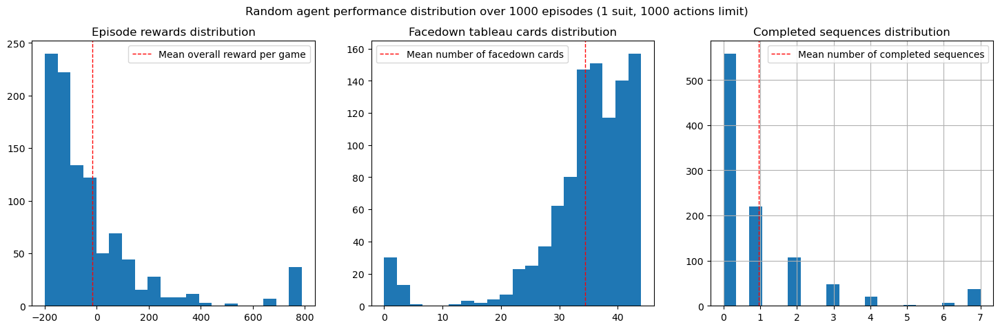

In [11]:
rand_agent_metrics_distrs = evaluate_agent(SpiderEnv(n_suits=1, n_actions_limit=1000,
                                                                        rewards_policy={"discover_card": 4,
                                                                                        "free pile": 16,
                                                                                        "extend sequence": 1,
                                                                                        "deal cards": -0.5},
                                                            mask_legal_actions=True),
                                                    n_episodes = 1000, n_bins = 20) 
plot_histogram(rand_agent_metrics_distrs,
               title="Random agent performance distribution over 1000 episodes (1 suit, 1000 actions limit)",
               )

### plotting functions for rewards


In [12]:
def plot_learning_progress(log_dir: str):
      # Path to Monitor log
      log_file = log_dir+"monitor.csv"
    
      df = pd.read_csv(log_file, comment='#')
      df.head()
    
      # Plot episode rewards 
      plt.plot(df['r'])
      plt.xlabel('Episode')
      plt.ylabel('Reward')
      plt.title('Episode Rewards over Time')
      plt.show()
    
      # Plot episode lengths
      # plt.plot(df['l'])
      # plt.xlabel('Episode')
      # plt.ylabel('Episode Length')
      # plt.title('Episode Lengths over Time')
      # plt.show()


def smooth_series(y, smooth=0.5, method='rolling'):
    y = np.asarray(y, dtype=float)
    n = len(y)
    if smooth <= 0 or n < 3:
        return y
    if method == 'ema':
        alpha = np.clip(smooth, 1e-4, 0.999)
        s = np.empty_like(y)
        s[0] = y[0]
        for i in range(1, n):
            s[i] = alpha * y[i] + (1 - alpha) * s[i - 1]
        return s
    if method == 'rolling':
        w = max(1, int(smooth * n))
        return pd.Series(y).rolling(w, min_periods=1, center=True).mean().to_numpy()
    raise ValueError("unknown method")

def plot_single_with_band(monitor_csv_path, smooth=0.5, method='rolling'):
    d = pd.read_csv(monitor_csv_path, comment='#').rename(columns={'r':'reward'})
    y = d['reward'].values
    x = np.arange(1, len(y)+1)
    sm = smooth_series(y, smooth=smooth, method=method)
    roll_std = pd.Series(y).rolling(max(3, int(0.05*len(y))), min_periods=1, center=True).std().to_numpy()
    plt.figure(figsize=(10,4))
    plt.plot(x, y, color='lightgray', alpha=0.6, label='raw')
    plt.plot(x, sm, color='C0', label=f'{method} smoothed (s={smooth})')
    plt.fill_between(x, sm - 1.96*roll_std, sm + 1.96*roll_std, color='C0', alpha=0.2, label='~95% band')
    plt.xlabel('Episode'); plt.ylabel('Reward'); plt.legend(); plt.grid(True)
    plt.show()

### Evaluation pipeline

Firstly select best models in **tensorboard**. Then compare visually distributions of _mean rewards_, _num of facedown cards at the end of game_ and _num of completed seqs_

#### The final goal of all the experiments is to shift the distribution of complete sequences completely to the right (to 8)

In [23]:
# combining code cells above together
import re 

def filename2hyperparams(filename: str) -> tuple[dict[str, int], float|dict[str, float]]:
    training_params = ['n_steps', 'batch_size', 'gamma']
    d_keys = {'dd': 'discover_card', 'fp':'free pile', 'es': 'extend sequence', 'dc': 'deal cards', 'ss': 'step'}
    d_rewards = {}
    d_agent_params = {}
    d_env_params = {}
    res = re.findall(r'\d+', filename)
    if filename.find('suit')>0:
        d_env_params['n_suits'] = int(res[0])
        res = res[1:]
    if len(res):
        d_env_params['n_actions_limit'] = int(res[0])
        res = res[1:]
    for si, p in zip(res, training_params):
        d_agent_params[p] = int(si)

    # parsing rewards policy dict
    for key, reward_name in d_keys.items():
        res = re.search(key+r'-?\d+(\.\d+)?', filename)
        if res is not None:
            res = res[0]
            reward_coef = float(res[len(key):])
            d_rewards[reward_name] = reward_coef
    d_env_params['rewards_policy'] = d_rewards

    return d_agent_params, d_env_params

from sb3_contrib import MaskablePPO
from sb3_contrib.common.wrappers import ActionMasker

def load_and_evaluate_model(filename, eval_random_walk=True,
                            path: str=SAVE_MODELS_DIR+'MaskablePPO_multiple_configs_parallel/', log_path: str=LOG_DIR+'MaskablePPO_multiple_configs_parallel/', 
                            n_eval_episodes=500, n_bins = 20, 
                            _dtype=np.int8, default_actions_limit=1000, default_n_suits=1) -> MaskablePPO:
    """Loads saved model provided by path `path+filename`, evaluates it on `n_eval_episodes` games, creates a SpiderEnv with corresponding params, and plots distributions of rewards, num of completed seqs and num of facedown cards, and, if `eval_random_walk=True`, does so for a random agent"""
    #filename = path[right_slash_pos if 0<(right_slash_pos:=path.rfind('/'))< len(path) else (path[: right_slash_pos].rfind('\\')+1 if path.find('\\') >=0 else 0): ]
    d_agent_params, d_env_params = filename2hyperparams(filename)
    n_suits = d_env_params.pop('n_suits', default_n_suits)
    n_actions_limit  =d_env_params.pop('n_actions_limit', default_actions_limit)
    env =ActionMasker(SpiderEnv(n_actions_limit=n_actions_limit , 
                                mask_legal_actions=True, 
                                _dtype=_dtype,
                                n_suits=n_suits,
                                vectorize_obs=(n_suits>1),
                                **d_env_params), 
                    action_mask_fn='get_action_mask')
    ppo_model = MaskablePPO.load(path+ filename, env=env)

    plot_single_with_band(monitor_csv_path=log_path + filename +'_monitor.csv', smooth=0.05, method='rolling')

    print(f"The env has the following rewards: {env.get_rewards_policy() if hasattr(env, 'get_rewards_policy') else env.env.get_rewards_policy()}")
    agent_metrics_distrs = evaluate_agent(env, agent=ppo_model, n_episodes = n_eval_episodes, n_bins = n_bins, deterministic=False) 
    plot_histogram(agent_metrics_distrs, 
               title=f"Maskable PPO agent performance distribution over {n_eval_episodes} episodes ({n_suits} suit{'s' if n_suits>1 else ''}, {n_actions_limit} actions limit), trained with the following params: {d_agent_params}"
               )
    if eval_random_walk:
        random_agent_metrics_distrs = evaluate_agent(env, n_episodes = n_eval_episodes, n_bins = n_bins) 
        plot_histogram(random_agent_metrics_distrs,
                title=f"Random agent performance distribution over {n_eval_episodes} episodes ({n_suits} suit{'s' if n_suits>1 else ''}, {n_actions_limit} actions limit)"
                )

    return ppo_model, env

### SpiderCallback to track learning progress

In [14]:
from stable_baselines3.common.callbacks import BaseCallback

class SpiderCallback(BaseCallback):
    def __init__(self, verbose=0):
        super().__init__(verbose)

    def _on_step(self) -> bool:   
        env = self.model.get_env()
        info = env.env_method("get_info")[0]

        seqs = info.get("n_complete_sequences", 0)
        facedown_cards = info.get("n_facedown_tableau_cards", 0)
        self.logger.record("spider/complete_sequences", seqs)
        self.logger.record("spider/facedown_tableau_cards", facedown_cards)

        return True

# Step 1: Experiments

## Experiment  1. DQN


In [ ]:
# import stable_baselines3
# from stable_baselines3 import DQN

# env = SpiderEnv(n_actions_limit=10_000, _dtype=np.float32, _render_state_timeout=10_000, 
#                 _diagnostics_mode=1, vectorize_obs=True)

# #VALIDATING ENV:
# from stable_baselines3.common.env_checker import check_env

# check_env(env, warn=True)
# model = DQN("MlpPolicy",
#            env,
#            learning_rate=1e-4,
#            buffer_size=100_000,
#            learning_starts=5_000,
#            batch_size=512,
#            gamma=0.99,
#            target_update_interval=1000,
#            train_freq=1,
#            verbose=1, 
#            device=DEVICE)
# model.learn(total_timesteps=1_000_000)

## Experiment 2. Maskable PPO
Before moving to the most difficult level of the game (with 4 suits, and roughly only 1/3 of games on this level can be won), it is useful to inspect which training, model and SpiderEnv hyperparameters are beneficial for improving model's behaviour. It's easy to investigate it on the simplest level of the game.

There are 3 categories of hyperparameters to tune:
- training: 
    - total number of timesteps
- model hyperparams:
    - n_steps
    - batch_size
	- learning_rate
	- gamma (can be beneficial for training to make it closer to 1 if the final reward is very distant)
    - _some others_
- SpiderEnv: 
    - `rewards_policy`
    - `actions_limit`: a random Spider game with one suit can be won in less then 100 steps, so limiting this value up to 1000 seems to be reasonable. Though it can be useful to choice lesser limits to avoid some behavior problems like _circular moves_
    

In [11]:
#!pip install stable-baselines3==1.5.1a8  sb3-contrib==1.1.0 --quiet
#!pip install sb3-contrib --quiet

Let's check how Maskable PPO works with 1 and 4 suits

In [5]:
import sb3_contrib
from sb3_contrib import MaskablePPO
from stable_baselines3.common.vec_env import DummyVecEnv
import numpy as np
from sb3_contrib.common.maskable.policies import MaskableActorCriticPolicy
from stable_baselines3.common.monitor import Monitor

#def make_env():
#    return env

#env = DummyVecEnv([make_env])

from sb3_contrib.common.wrappers import ActionMasker

def train_maskable_ppo(n_suits: int =1, log_dir: str = LOG_DIR+'MaskablePPO_1suit/',
                       actions_limit: int =1000, n_steps: int =1*1000, batch_size: int =1000, total_timesteps: int =1000_000,
                       verbose: int =1,
                       lr: float =3e-4, gamma: float =0.995,
                       rewards_policy:dict[str, float]={"discover_card": 4,
                                                        "free pile": 16,
                                                        "extend sequence": 1,
                                                        "deal cards": -0.5},
                        _render_state_timeout=1_0000,  _diagnostics_mode=0, 
                        tb_log_name: str =None
                    ):
    """Train MaskablePPO on Spider Solitaire environment."""
    env = SpiderEnv(n_actions_limit=actions_limit, _dtype=np.float32, _render_state_timeout=_render_state_timeout, 
                        _diagnostics_mode=_diagnostics_mode, vectorize_obs=(n_suits>1), mask_legal_actions=True,
                    #rewards_limit=True,
                    n_suits=n_suits,
                    
                    rewards_policy =rewards_policy
                    )  # must return action_mask in info
    env = Monitor(env,log_dir)
    env = ActionMasker(env, action_mask_fn=lambda e: e.env.get_action_mask())

    model = MaskablePPO(
        "MlpPolicy",
        env,
        verbose=verbose,
        n_steps   =n_steps,#1000
        batch_size=batch_size,#the whole game is used to update the policy, updates can be more stable than when games are splitted into smaller chunks
        learning_rate=lr,
        gamma=gamma,
        device="auto",
        tensorboard_log=log_dir
    )

    l = model.learn(total_timesteps=total_timesteps,callback=SpiderCallback(), 
                    tb_log_name=f"MaskablePPO_{n_suits}suits_{actions_limit}_{n_steps}_{batch_size}" if tb_log_name is None else tb_log_name)
    return model


### 1 suit

#### Varying n_steps

In [24]:
actions_limit = 1000
model11= train_maskable_ppo(n_suits=1, log_dir=LOG_DIR+'MaskablePPO_1suit/', actions_limit=actions_limit,
                        n_steps=actions_limit-1, batch_size=actions_limit, total_timesteps=actions_limit**2,
                        verbose=1,
                        rewards_policy={"discover_card": 4,
                                        "free pile": 16,
                                        "extend sequence": 1,
                                        "deal cards": -0.5},
                        _render_state_timeout=1_000,  _diagnostics_mode=0
                    )


Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to ../logs/training/MaskablePPO_1suit/MaskablePPO_1suits_1000_999_1000_3
----------------------------------
| spider/                  |     |
|    complete_sequences    | 0   |
|    facedown_tableu_cards | 35  |
| time/                    |     |
|    fps                   | 473 |
|    iterations            | 1   |
|    time_elapsed          | 2   |
|    total_timesteps       | 999 |
----------------------------------
Number of complete sequences: 0
Stock cards: 0
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂫 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂪 🂠 🂮
🂠 🂦 🂠 🂠 🂠 🂫 🂠 🂩 🂢 🂮
🂠 🂩 🂠 🂠 🂥 🂪 🂨   🂡 🂭
🂮 🂩 🂮 🂫 🂤 🂦 🂧   🂤 🂫
🂦 🂨 🂢 🂧 🂣 🂡 🂤   🂩 🂪
🂥   🂦 🂦 🂩   🂣   🂨 🂩
🂤   🂥 🂥 🂨   🂢     🂨
🂣   🂤 🂤 🂭   🂡      
🂪   🂣 🂣 🂡   🂡      
🂨   🂢 🂢     🂦      
🂮   🂡 🂮     🂥      
🂭     🂤     🂤      
🂫     🂡     🂣      
terminated: True, truncated: True
-------------------------------------------
| rollout/                 |              |
|    ep_len_mean           | 1e+03        |
|   

In [ ]:
# env = SpiderEnv(vectorize_obs=False, mask_legal_actions=True)
# obs = env.reset()
# load your model or instantiate quickly:
# model = PPO.load("path_to_model", env=env)
# For quick inspect, use model.policy.forward(...) if you have model
# Example pseudo-check (adapt to your model API):
# with torch.no_grad():
#     dist = model.policy.get_distribution(torch.as_tensor(obs).unsqueeze(0))
#     probs = dist.distribution.probs.cpu().numpy()
#     print("probs", probs, "anynan", np.isnan(probs).any(), "anyneg", (probs<0).any(), "sum", probs.sum())
print("Run this snippet with your model to inspect probs")

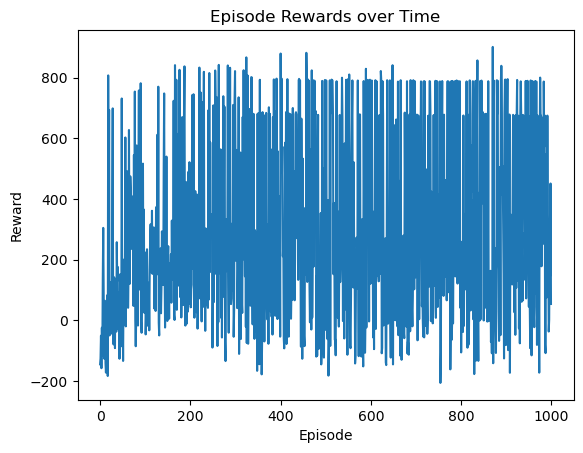

In [25]:
plot_learning_progress(LOG_DIR+'MaskablePPO_1suit/')

In [26]:
actions_limit = 1000
model12= train_maskable_ppo(n_suits=1, log_dir=LOG_DIR+'MaskablePPO_1suit/', actions_limit=actions_limit,
                        n_steps=2*actions_limit-1, batch_size=actions_limit, total_timesteps=actions_limit**2,
                        verbose=1,
                        rewards_policy={"discover_card": 4,
                                        "free pile": 16,
                                        "extend sequence": 1,
                                        "deal cards": -0.5},
                        _render_state_timeout=1_000,  _diagnostics_mode=0
                    )

Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to ../logs/training/MaskablePPO_1suit/MaskablePPO_1suits_1000_1999_1000_1
Number of complete sequences: 1
Stock cards: 0
🂠 🂩 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂨 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠   🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠   🂠 🂠 🂠 🂠 🂩 🂠 🂢 🂠
🂨   🂠 🂥 🂫 🂣   🂫 🂡 🂨
🂢   🂨 🂮 🂮 🂥   🂪   🂧
🂩   🂮 🂭 🂮 🂤   🂣   🂣
🂨   🂭   🂭 🂢   🂡   🂢
🂧   🂫   🂫 🂩   🂭   🂡
🂦   🂡   🂪     🂣   🂦
    🂮   🂤     🂩   🂥
    🂭         🂨   🂤
              🂧   🂣
              🂦   🂢
              🂥   🂡
              🂤    
terminated: True, truncated: True
---------------------------------------
| rollout/                 |          |
|    ep_len_mean           | 1e+03    |
|    ep_rew_mean           | -37      |
| spider/                  |          |
|    complete_sequences    | 1        |
|    facedown_tableu_cards | 25       |
| time/                    |          |
|    fps                   | 480      |
|    iterations            | 1        |
|    time_elapsed          | 4        |
|    total_timesteps     

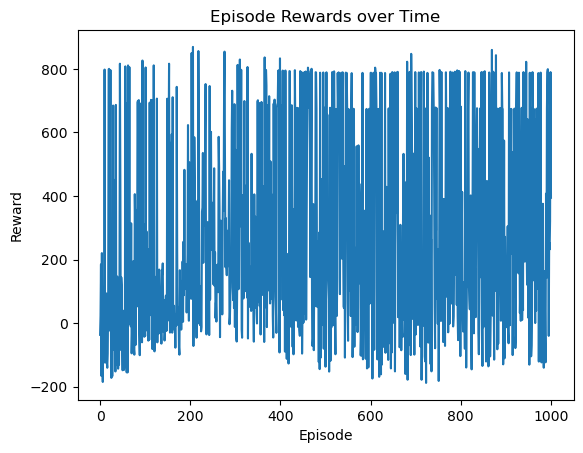

In [27]:
plot_learning_progress(LOG_DIR+'MaskablePPO_1suit/')

In [28]:
actions_limit = 1000
model12= train_maskable_ppo(n_suits=1, log_dir=LOG_DIR+'MaskablePPO_1suit/', actions_limit=actions_limit,
                        n_steps=4*actions_limit-1, batch_size=actions_limit, total_timesteps=actions_limit**2,
                        verbose=1,
                        rewards_policy={"discover_card": 4,
                                        "free pile": 16,
                                        "extend sequence": 1,
                                        "deal cards": -0.5},
                        _render_state_timeout=1_0000,  _diagnostics_mode=0
                    )

Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to ../logs/training/MaskablePPO_1suit/MaskablePPO_1suits_1000_3999_1000_1
---------------------------------------
| rollout/                 |          |
|    ep_len_mean           | 1e+03    |
|    ep_rew_mean           | -123     |
| spider/                  |          |
|    complete_sequences    | 0        |
|    facedown_tableu_cards | 40       |
| time/                    |          |
|    fps                   | 491      |
|    iterations            | 1        |
|    time_elapsed          | 8        |
|    total_timesteps       | 3999     |
---------------------------------------
------------------------------------------
| rollout/                 |             |
|    ep_len_mean           | 1e+03       |
|    ep_rew_mean           | -112        |
| spider/                  |             |
|    complete_sequences    | 1           |
|    facedown_tableu_cards | 39          |
| time/                    |             |
| 

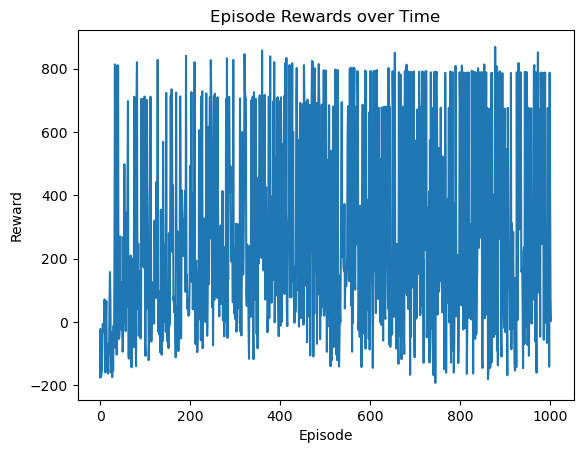

In [29]:
plot_learning_progress(LOG_DIR+'MaskablePPO_1suit/')

In [68]:
actions_limit = 1000
model12= train_maskable_ppo(n_suits=1, log_dir=LOG_DIR+'MaskablePPO_1suit/', actions_limit=actions_limit,
                        n_steps=8*actions_limit-1, batch_size=actions_limit, total_timesteps=actions_limit**2,
                        verbose=1,
                        rewards_policy={"discover_card": 4,
                                        "free pile": 16,
                                        "extend sequence": 1,
                                        "deal cards": -0.5},
                        _render_state_timeout=1_0000,  _diagnostics_mode=0
                    )

Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to ../logs/training/MaskablePPO_1suit/MaskablePPO_1suits_1000_7999_1000_1
---------------------------------------
| rollout/                 |          |
|    ep_len_mean           | 1e+03    |
|    ep_rew_mean           | -40.5    |
| spider/                  |          |
|    complete_sequences    | 0        |
|    facedown_tableu_cards | 35       |
| time/                    |          |
|    fps                   | 459      |
|    iterations            | 1        |
|    time_elapsed          | 17       |
|    total_timesteps       | 7999     |
---------------------------------------
------------------------------------------
| rollout/                 |             |
|    ep_len_mean           | 1e+03       |
|    ep_rew_mean           | -19.2       |
| spider/                  |             |
|    complete_sequences    | 0           |
|    facedown_tableu_cards | 35          |
| time/                    |             |
| 

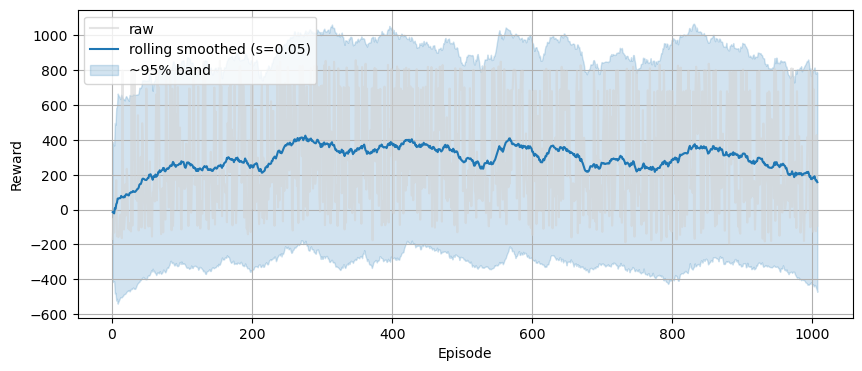

In [74]:
#plot_learning_progress(LOG_DIR+'MaskablePPO_1suit/')
plot_single_with_band(monitor_csv_path=LOG_DIR+'MaskablePPO_1suit/monitor.csv', smooth=0.05, method='rolling')

In [16]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [17]:
%reload_ext tensorboard

In [18]:
LOG_DIR+'MaskablePPO_1suit/'

'../logs/training/MaskablePPO_1suit/'

In [100]:
%tensorboard --logdir 'C:\Users\alex3\Projects\RL\SpiderSolitaire\logs\training\MaskablePPO_1suit\'

Reusing TensorBoard on port 6006 (pid 30596), started 11:29:44 ago. (Use '!kill 30596' to kill it.)

#### having n_steps = 8k shows maximum effect in term of number of completed seqs and left facedown cards, n_steps =1k overfits model to earn more intermediate rewards

#### 1 suit, parallel

In [90]:
log_dir = LOG_DIR+'MaskablePPO_1suit/'

import os
print(os.getcwd())

c:\Users\alex3\Projects\RL\SpiderSolitaire\notebooks


In [19]:
import subprocess
import sys
from pathlib import Path
import os

# Use the conda env python for consistent deps
conda_python = Path(r"C:\Users\alex3\.conda_envs\rl_env\python.exe")
repo_root = Path('..').resolve()  # .../Projects/RL
script_path = repo_root / 'SpiderSolitaire' / 'scripts' / 'train_maskablePPO_parallel.py'

print(f"Running: {script_path} with {conda_python}")

# Stream output live like PowerShell
proc = subprocess.Popen(
    [str(conda_python), str(script_path), '--n_envs', '28', '--total_timesteps', '1000000'],
    stdout=subprocess.PIPE,
    stderr=subprocess.PIPE,
    text=True,
    bufsize=1
)

# Read stdout/stderr incrementally
for line in proc.stdout:
    print(line, end='')

err = proc.stderr.read()
if err:
    print("\nSTDERR:\n", err)

rc = proc.wait()
print("\nReturn code:", rc)


Running: C:\Users\alex3\Projects\RL\SpiderSolitaire\SpiderSolitaire\scripts\train_maskablePPO_parallel.py with C:\Users\alex3\.conda_envs\rl_env\python.exe

STDERR:
 C:\Users\alex3\.conda_envs\rl_env\python.exe: can't open file 'C:\\Users\\alex3\\Projects\\RL\\SpiderSolitaire\\SpiderSolitaire\\scripts\\train_maskablePPO_parallel.py': [Errno 2] No such file or directory


Return code: 2


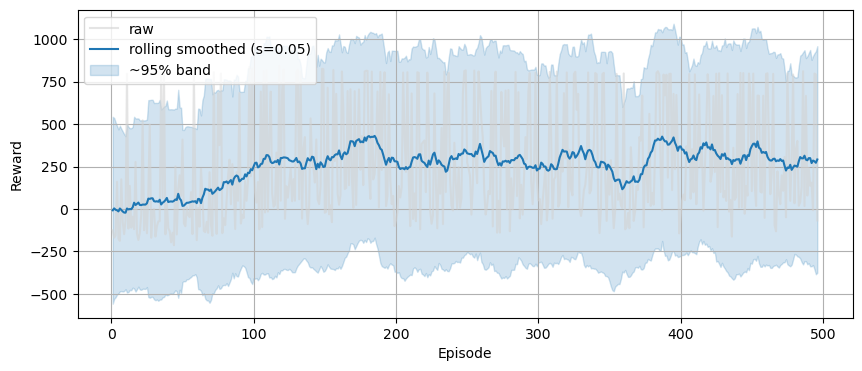

In [75]:
#plot_learning_progress(LOG_DIR+'MaskablePPO_1suit/')
# plot of mean reward of the last trained model
plot_single_with_band(monitor_csv_path=LOG_DIR+'MaskablePPO_1suit/vecmonitor.csv', smooth=0.05, method='rolling')

#### Compare the last trained model (varied hyperparameters and rewards) with random walk on the same env with same rewards

In [77]:
env = SpiderEnv(n_actions_limit=1000, mask_legal_actions=True, 
                _dtype=np.float32,
                n_suits=1,rewards_policy ={"discover_card": 4,
                                           "free pile": 16,
                                           'extend sequence': 1,
                                            "deal cards": -0.5}
                )
ppo_model = MaskablePPO.load(SAVE_MODELS_DIR+'MaskablePPO_1suit/MaskablePPO_1suits_16_parenvs_1000_249_500__dd4_fp16_es1_dc-0.5', env=env)

Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


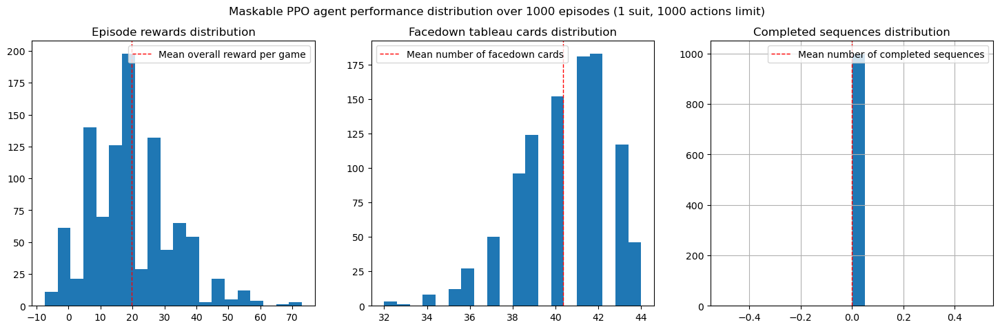

In [98]:
agent_metrics_distrs = evaluate_agent(env, agent=ppo_model, n_episodes = 1000, n_bins = 20, deterministic=False) 
plot_histogram(agent_metrics_distrs, 
               title="Maskable PPO agent performance distribution over 1000 episodes (1 suit, 1000 actions limit)"
               )

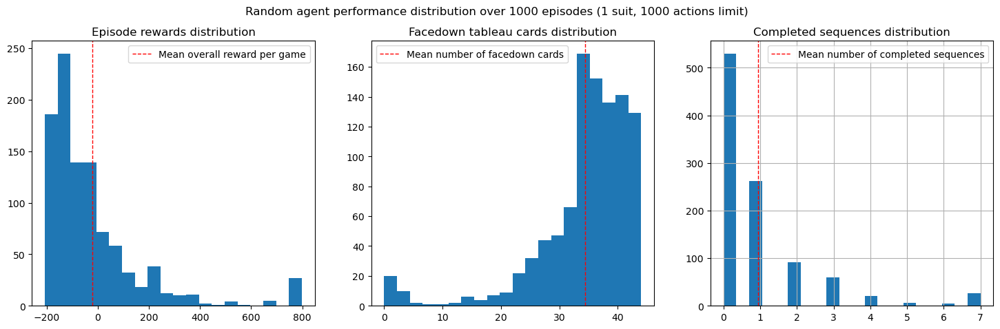

In [99]:
rand_agent_metrics_distrs = evaluate_agent(env, n_episodes = 1000, n_bins = 20) 
plot_histogram(rand_agent_metrics_distrs, 
               title="Random agent performance distribution over 1000 episodes (1 suit, 1000 actions limit)",
               )

In [45]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [17]:
env = SpiderEnv(n_actions_limit=1000, mask_legal_actions=True, 
                _dtype=np.float32,
                n_suits=1,rewards_policy ={"discover_card": 4,
                                           "free pile": 16,
                                           'extend sequence': 1,
                                            "deal cards": -0.5}
                ) 
#, action_mask_fn=lambda e: e.env.unwrapped.get_action_mask())

ppo_model = MaskablePPO.load(SAVE_MODELS_DIR+'MaskablePPO_1suit/MaskablePPO_1suits_16_parenvs_1000_249_500__dd4_fp16_es1_dc-0.5', env=env)

agent_demo(env, agent=ppo_model, sleep_time=20, deterministic=True)

Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


TypeError: MaskablePPO.predict() got an unexpected keyword argument 'action_mask'. Did you mean 'action_masks'?

#### Parallel training and evaluation of different env, model and training configs
Since running parallel envs and updating model params seems to be instable, it makes sense to select and evaluate different configs and run them simultaneously (`scripts\train_maskablePPO_multiple_configs_parallel.py`)

##### One particular model

In [10]:
env =ActionMasker(SpiderEnv(n_actions_limit=1000, mask_legal_actions=True, 
                    _dtype=np.int8,
                    n_suits=1,rewards_policy ={"discover_card": 5,
                                            "free pile": 1,
                                            'extend sequence': 0.2,
                                                "deal cards": -0.2}
                    ), action_mask_fn='get_action_mask')
                
ppo_model = MaskablePPO.load(SAVE_MODELS_DIR+'MaskablePPO_multiple_configs_parallel/MaskablePPO_1suits_1000_4096_512__dd5_fp1_es0.2_dc-0.2', env=env)

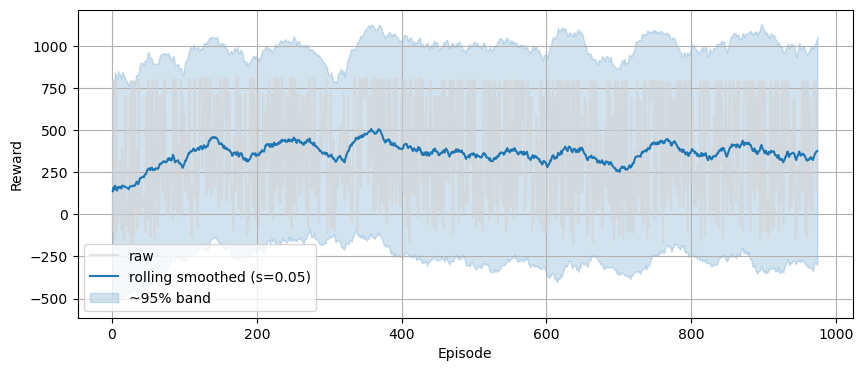

In [18]:
#plot_learning_progress(LOG_DIR+'MaskablePPO_1suit/')
# plot of mean reward of the last trained model
plot_single_with_band(monitor_csv_path=LOG_DIR+'MaskablePPO_multiple_configs_parallel/MaskablePPO_1suits_1000_4096_512__dd5_fp1_es0.2_dc-0.2_monitor.csv', smooth=0.05, method='rolling')

In [44]:
agent_demo(env, agent=ppo_model, sleep_time=10, deterministic=True)

Action taken: Move top 1 cards from pile 2 to pile 7
reward: 7.6
Number of complete sequences: 0
Stock cards: 50
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂦 🂠 🂧 🂡 🂡 🂨 🂩 🂪
🂮 🂨   🂧       🂧    
Action taken: Move top 1 cards from pile 2 to pile 7
reward: 7.6
Number of complete sequences: 0
Stock cards: 50
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂧 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠   🂠 🂧 🂡 🂡 🂨 🂩 🂪
🂮 🂨   🂧       🂧    
              🂦    
Action taken: Move top 1 cards from pile 7 to pile 3
reward: -0.2
Number of complete sequences: 0
Stock cards: 50
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂧 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠   🂠 🂧 🂡 🂡 🂨 🂩 🂪
🂮 🂨   🂧       🂧    
      🂦            
Action taken: Move top 1 cards from pile 4 to pile 1
reward: 7.6
Number of complete sequences: 0
Stock cards: 50
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂧 🂠 🂩 🂠 🂠 🂠 🂠 🂠
🂠 🂠   🂠   🂡 🂡 🂨 🂩 🂪
🂮 🂨   🂧       🂧    
  🂧   🂦            
Action 

KeyboardInterrupt: 

_Circular moves_


As it can be noticed from the demo above, an agent have a tendency to chose circular sequences of actions. For example, it moves a card from pile 0 to pile 2, then it moves the same card from pile 2 to some another pile... and then it moves it back to pile 0, though each time it was punished for an extra move.

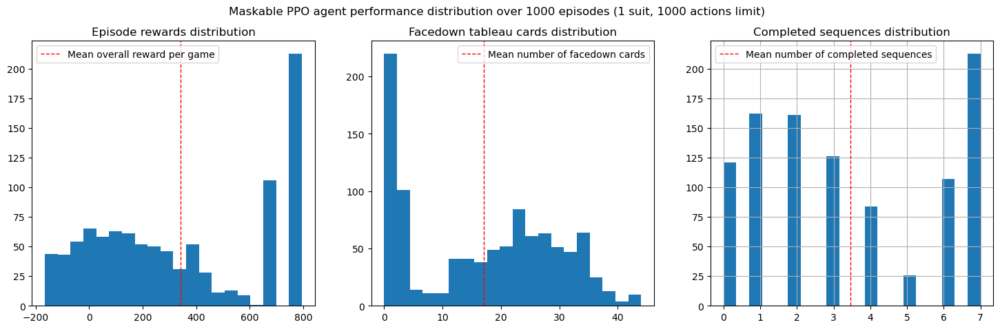

In [14]:
agent_metrics_distrs = evaluate_agent(env, agent=ppo_model, n_episodes = 1000, n_bins = 20, deterministic=False) 
plot_histogram(agent_metrics_distrs, 
               title="Maskable PPO agent performance distribution over 1000 episodes (1 suit, 1000 actions limit)"
               )

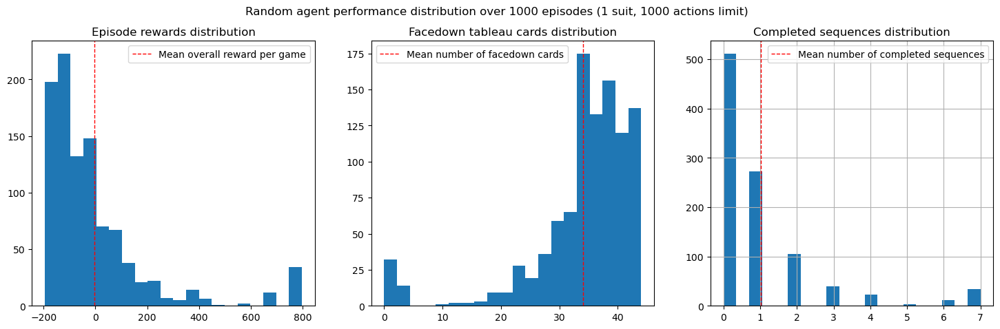

In [72]:
random_agent_metrics_distrs = evaluate_agent(env, n_episodes = 1000, n_bins = 20) 
plot_histogram(random_agent_metrics_distrs, 
               title="Random agent performance distribution over 1000 episodes (1 suit, 1000 actions limit)"
               )

##### Evaluation of best models selected visually based on comparison of learning curves ( `rollout/ep_rew_mean`, `spider/facedown_tableau_cards`, `spider/facedown_tableau_cards`) in **tensorboard**

###### Models trained with max episode len 1000, n_steps = 2048 or 4096 , batch_size = 256, 512, 1024 or 2048
4 of them vere selected

![Screenshot 2025-12-15 024704.png](<attachment:Screenshot 2025-12-15 024704.png>)
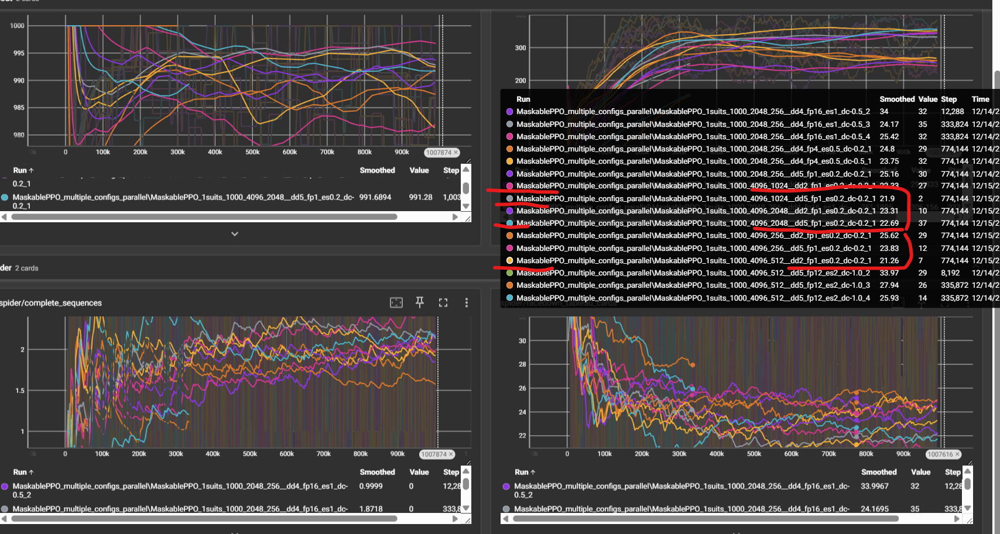

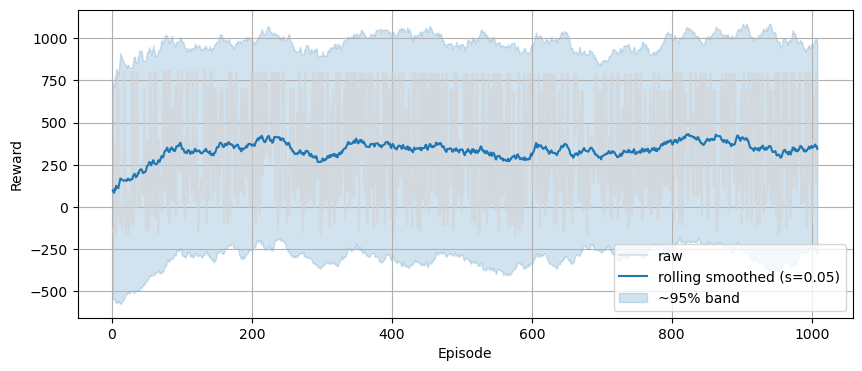

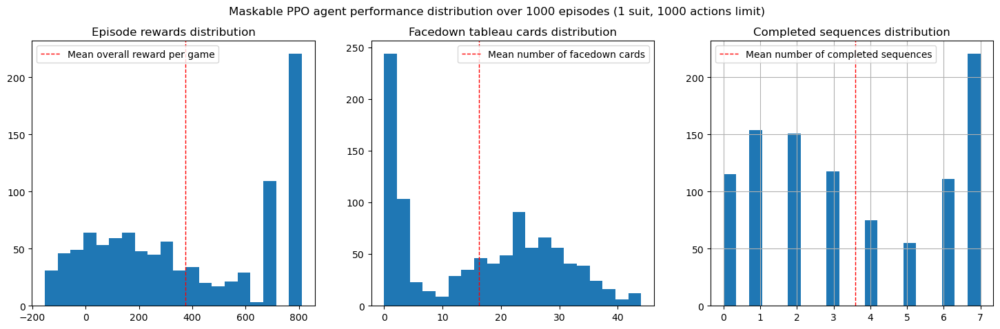

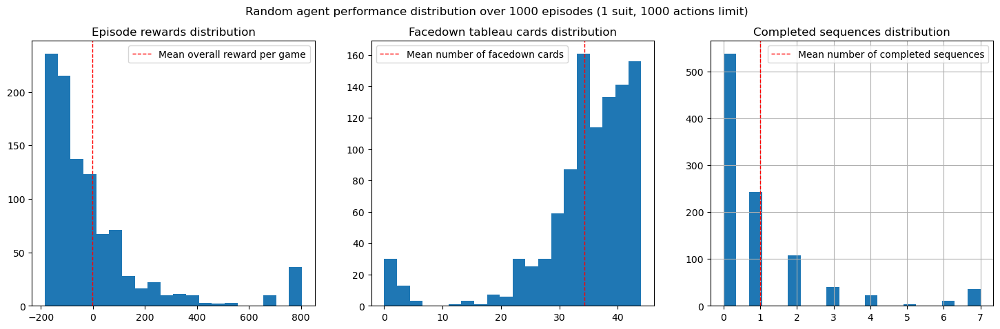

(<sb3_contrib.ppo_mask.ppo_mask.MaskablePPO at 0x1ac67781810>,
 <ActionMasker<SpiderEnv instance>>)

In [141]:
load_and_evaluate_model('MaskablePPO_1suits_1000_4096_1024__dd2_fp1_es0.2_dc-0.2', n_eval_episodes=1000)

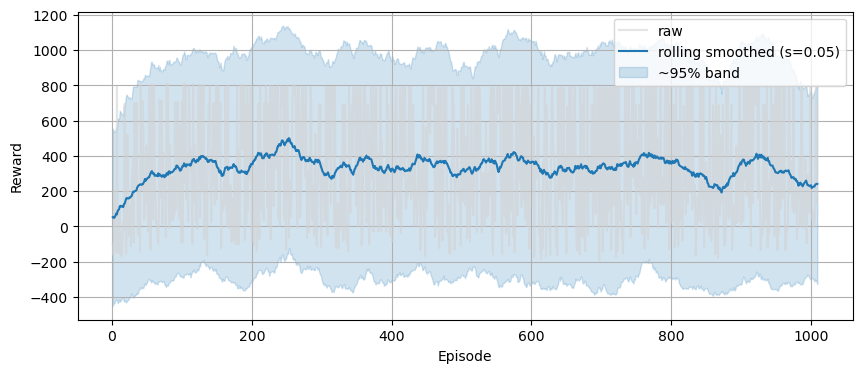

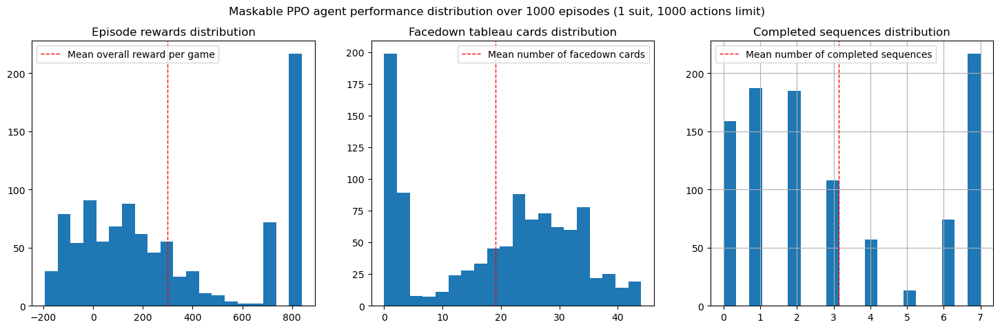

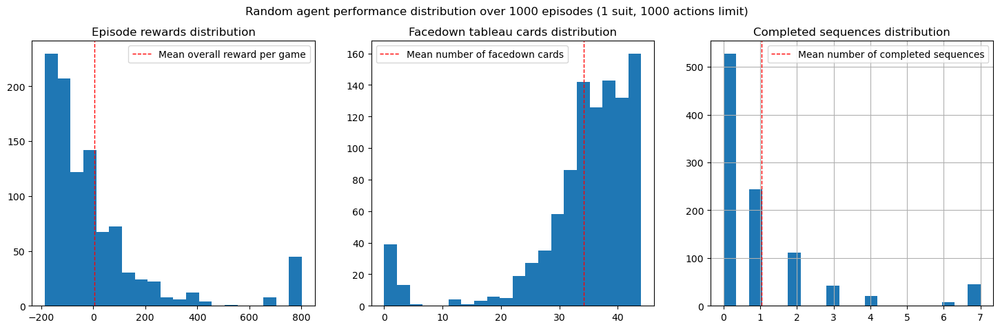

(<sb3_contrib.ppo_mask.ppo_mask.MaskablePPO at 0x1ac4ccc8550>,
 <ActionMasker<SpiderEnv instance>>)

In [ ]:
load_and_evaluate_model('MaskablePPO_1suits_1000_4096_1024__dd5_fp1_es0.2_dc-0.2', n_eval_episodes=1000)


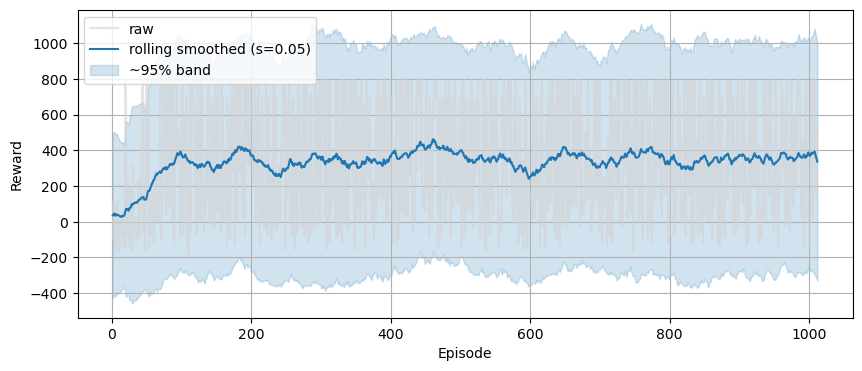

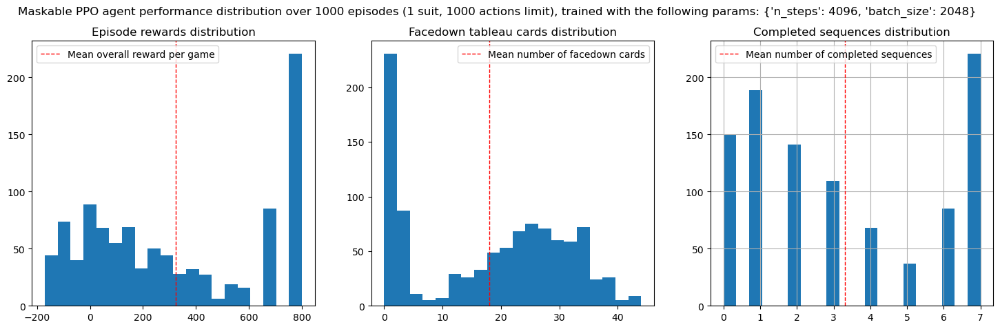

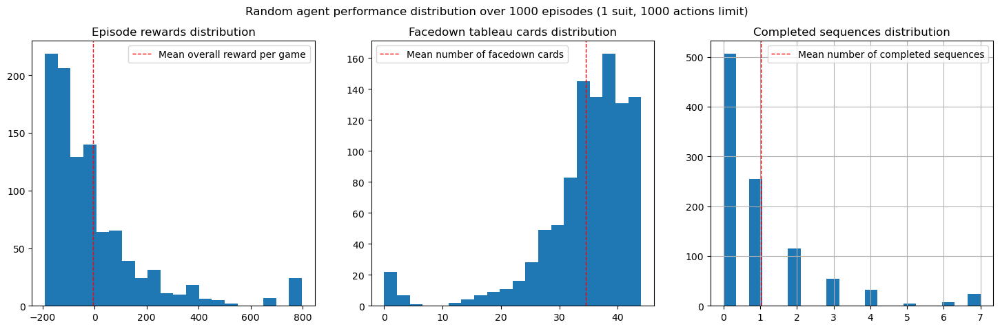

(<sb3_contrib.ppo_mask.ppo_mask.MaskablePPO at 0x1ac714d8410>,
 <ActionMasker<SpiderEnv instance>>)

In [166]:
load_and_evaluate_model('MaskablePPO_1suits_1000_4096_2048__dd2_fp1_es0.2_dc-0.2', n_eval_episodes=1000)

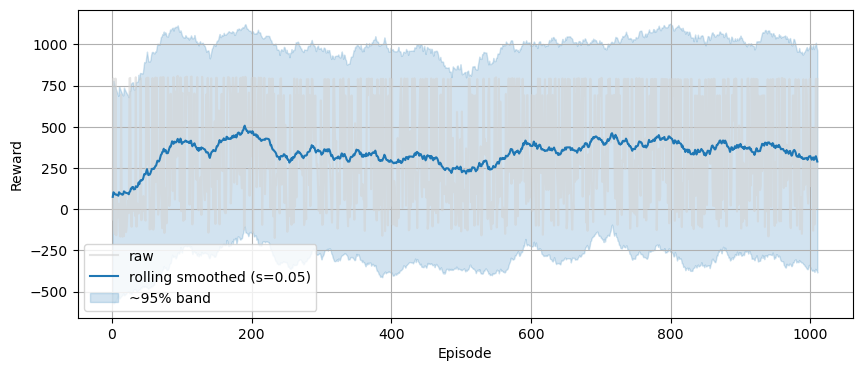

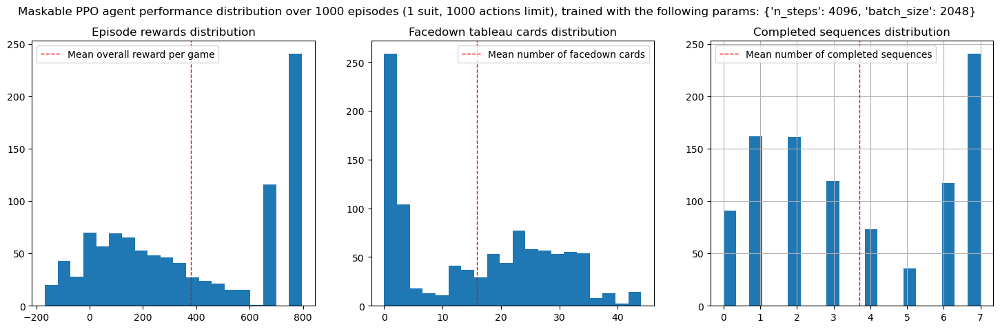

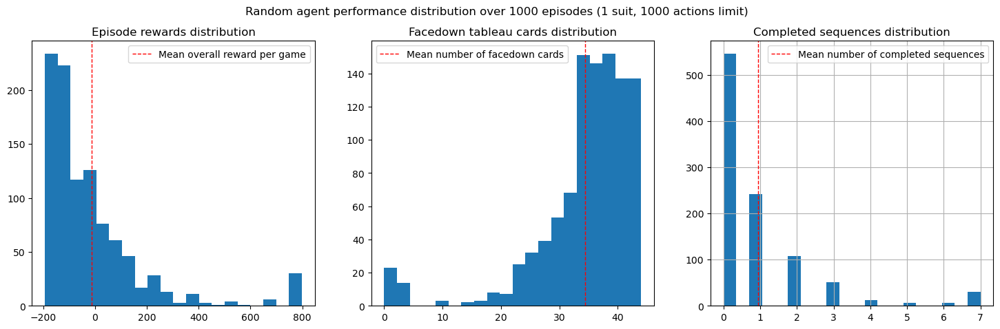

(<sb3_contrib.ppo_mask.ppo_mask.MaskablePPO at 0x1ac7861bed0>,
 <ActionMasker<SpiderEnv instance>>)

In [167]:
load_and_evaluate_model('MaskablePPO_1suits_1000_4096_2048__dd5_fp1_es0.2_dc-0.2', n_eval_episodes=1000)

Well, visual comparison of the distributions shows that Maskable PPO learns at least something

###### Models trained 24 configs: n_steps==4096, batch_size in {512, 1024, 2048}, rewards: discover_card in {2,5}, step in {-0.2, -0.4}, deal_cards==-extend sequence==-0.2
1 of them showed extraordinary, but suspicious results and 4 other of them vere selected 



In [175]:
actions_limit = 1024
model_e= train_maskable_ppo(n_suits=1, log_dir=LOG_DIR+'MaskablePPO_1suit/', actions_limit=actions_limit,
                        n_steps=4096, batch_size=512, total_timesteps=57*1024,
                        verbose=1,
                        rewards_policy={"discover_card": 5,
                                        "free pile":0.4,
                                        "extend sequence": 0.2,
                                        "deal cards": -0.2, 
                                        'step': -0.4},
                        _render_state_timeout=actions_limit,  _diagnostics_mode=0
                    )

Using cpu device
Wrapping the env in a DummyVecEnv.
Logging to ../logs/training/MaskablePPO_1suit/MaskablePPO_1suits_1024_4096_512_2
Actions taken: 1024
Number of complete sequences: 0
Stock cards: 0
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂨 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂩 🂧 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂨 🂦 🂡 🂮 🂭
🂠 🂨 🂡 🂤 🂢 🂨 🂥 🂮 🂧 🂢
🂮 🂧 🂩 🂣 🂭 🂧 🂤 🂭 🂦 🂪
🂭 🂡 🂨 🂡 🂫   🂣 🂫 🂥 🂩
🂡 🂥   🂥 🂪   🂮 🂪 🂤 🂨
🂣     🂤 🂩     🂩 🂣  
🂮     🂣 🂢     🂨 🂤  
🂭     🂢 🂥     🂧 🂥  
🂫     🂡 🂤     🂦    
🂪       🂣     🂥    
🂮             🂤    
              🂣    
              🂫    
              🂡    
terminated: True, truncated: True
Actions taken: 1024
Number of complete sequences: 0
Stock cards: 0
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂠 🂩 🂠 🂧 🂤 🂠 🂠
🂠 🂣 🂠 🂠 🂨 🂠 🂦 🂥 🂠 🂠
🂠 🂢 🂠 🂠 🂧 🂮 🂥 🂮 🂩 🂤
🂢 🂡 🂩 🂫 🂦 🂭 🂦 🂥 🂡 🂮
🂡 🂣 🂫 🂪 🂮 🂥 🂨 🂫 🂢 🂧
🂦 🂢 🂭 🂩 🂭 🂤 🂧   🂪 🂣
🂦 🂭 🂣 🂭 🂨 🂣 🂮   🂪 🂨
🂤 🂥 🂢 🂮 🂧 🂢     🂫 🂧
🂣         🂥     🂪 🂨
🂫                 🂧
                  🂦
                  🂥
terminated: True, truncated: True
Actions taken: 1024
Number of complete sequen

Actions taken: 1000
Number of complete sequences: 0
Stock cards: 0
🂠 🂠 🂠 🂢 🂭 🂠 🂠 🂠 🂠 🂠
🂠 🂠 🂠 🂡 🂩 🂠 🂠 🂪 🂠 🂠
🂠 🂠 🂠 🂮 🂨 🂠 🂭 🂡 🂠 🂠
🂠 🂠 🂠   🂧 🂠 🂫   🂣 🂮
🂠 🂧 🂭   🂦 🂣 🂪   🂭  
🂡 🂦 🂫   🂥   🂩   🂫  
🂭 🂥 🂪   🂤   🂮   🂪  
🂫 🂢 🂩   🂣   🂭   🂩  
🂥 🂭 🂫   🂢   🂢   🂨  
🂤 🂩 🂪   🂡   🂮   🂧  
🂣 🂨 🂩           🂦  
🂢 🂧             🂥  
🂡 🂦             🂤  
  🂥             🂣  
  🂤             🂧  
  🂣             🂥  
                🂤  
                🂪  
                🂩  
                🂨  
                🂩  
                🂨  
                🂧  
                🂦  
                🂥  
                🂤  
                🂣  
                🂢  
                🂡  
terminated: False, truncated: False
Actions taken: 1000
Number of complete sequences: 4
Stock cards: 0
🂮 🂢 🂥 🂠 🂫 🂮 🂠 🂠 🂠 🂨
    🂤 🂠   🂭 🂮 🂠 🂠  
    🂣 🂠   🂫   🂥 🂠  
    🂢 🂠       🂤 🂮  
    🂡 🂫       🂣 🂭  
      🂪       🂢 🂫  
      🂩       🂡 🂪  
      🂣            
      🂩            
      🂨            
      🂧            
      🂡            
      🂪   

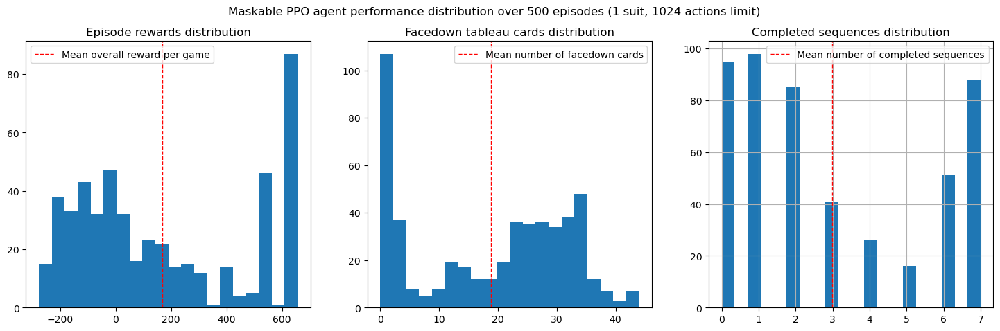

In [176]:
agent_metrics_distrs = evaluate_agent(SpiderEnv(rewards_policy={"discover_card": 5,
                                                                    "free pile":0.4,
                                                                    "extend sequence": 0.2,
                                                                    "deal cards": -0.2, 
                                                                    'step': -0.4},
                                                                    n_suits=1, 
                                                    _render_state_timeout=1000,  _diagnostics_mode=0,
                                                    n_actions_limit=actions_limit), 
                        agent=model_e, 

                        n_episodes = 500, n_bins = 20, deterministic=False) 
plot_histogram(agent_metrics_distrs, 
               title=f"Maskable PPO agent performance distribution over {500} episodes ({1} suit, {actions_limit} actions limit)"
               )

In [ ]:
%tensorboard log_dir "./logs/training/MaskablePPO_1suit/"

compare with the best 4 selected from the prev sim training:
![Screenshot 2025-12-15 164729.png](<attachment:Screenshot 2025-12-15 164729.png>)
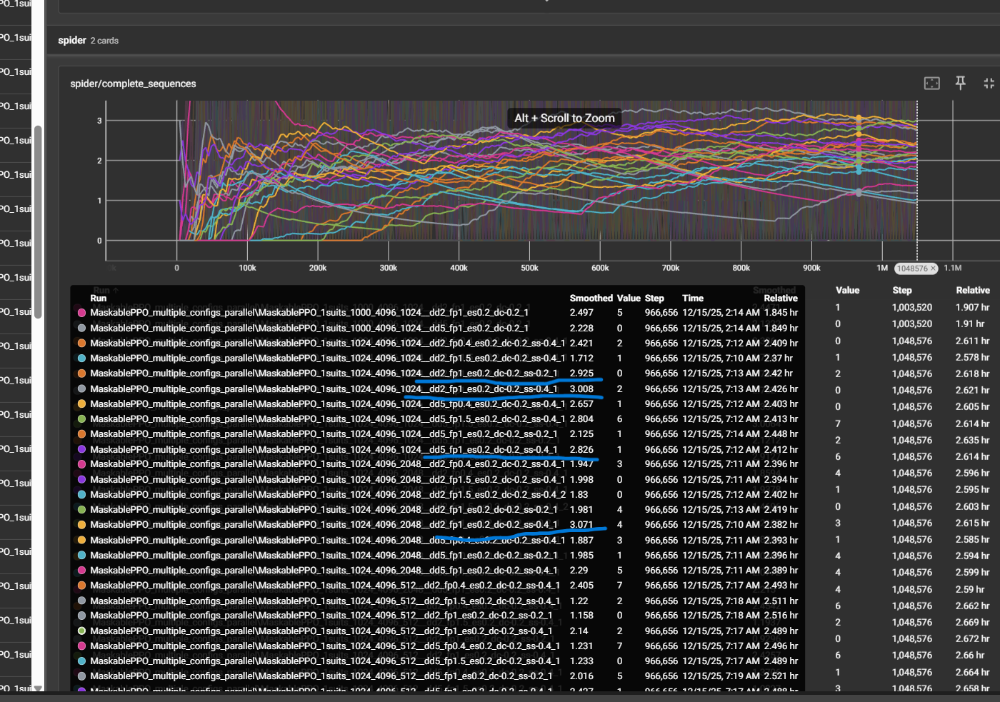

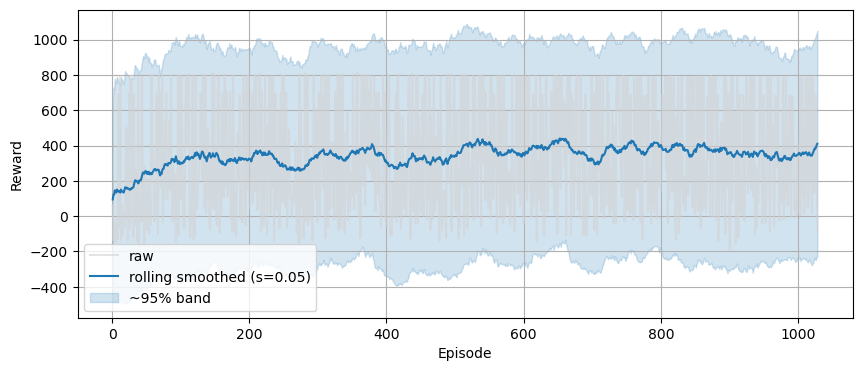

The env has the following rewards: {'complete sequence': 100.0, 'victory': 1000.0, 'step': -0.2, 'NOOP': -0.4, 'discover card': 8.0, 'extend sequence': 0.2, 'deal cards': -0.2, 'free pile': 1.0, 'no available actions': -100, 'reward limit': 200, 'discover_card': 2.0}


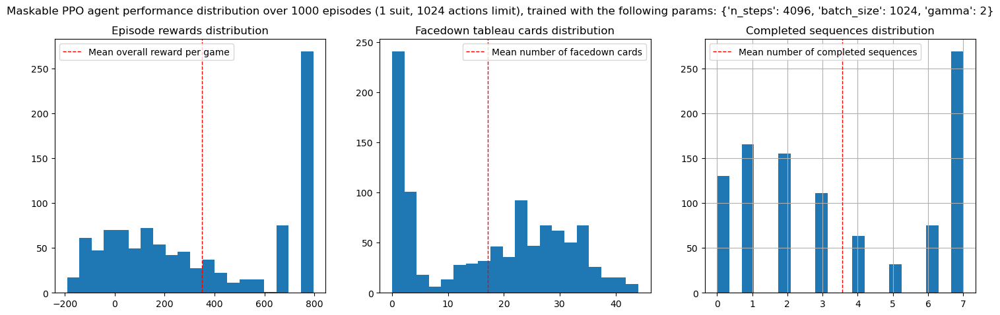

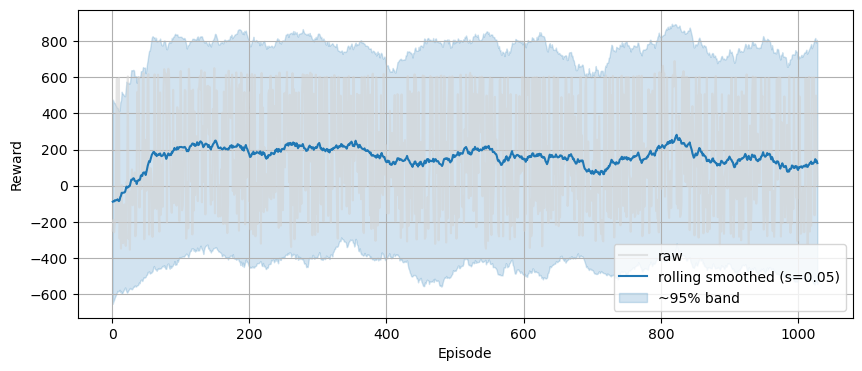

The env has the following rewards: {'complete sequence': 100.0, 'victory': 1000.0, 'step': -0.4, 'NOOP': -0.4, 'discover card': 8.0, 'extend sequence': 0.2, 'deal cards': -0.2, 'free pile': 1.0, 'no available actions': -100, 'reward limit': 200, 'discover_card': 2.0}


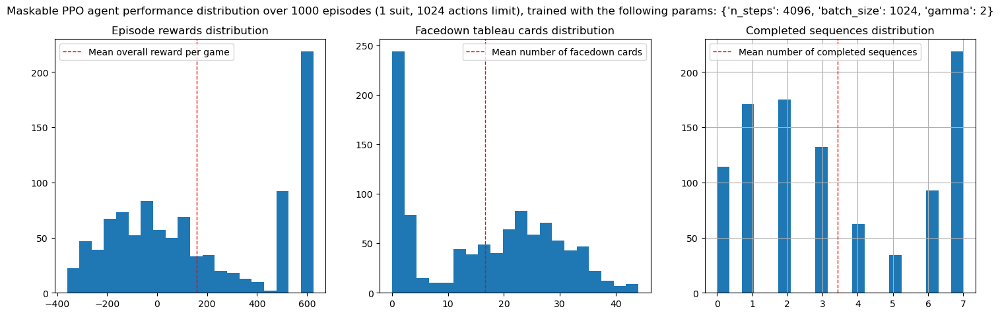

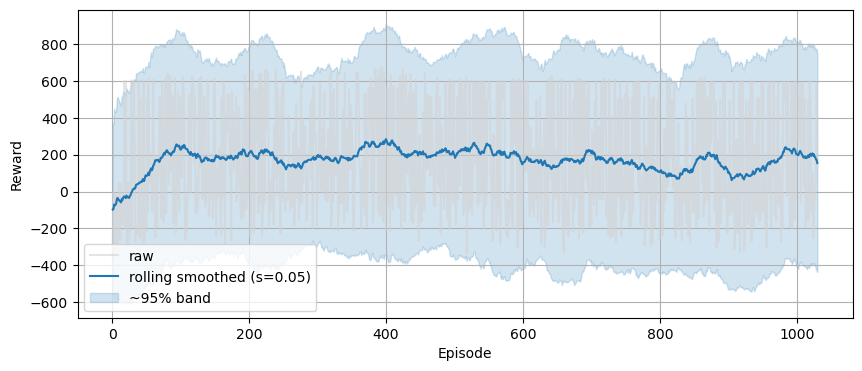

The env has the following rewards: {'complete sequence': 100.0, 'victory': 1000.0, 'step': -0.4, 'NOOP': -0.4, 'discover card': 8.0, 'extend sequence': 0.2, 'deal cards': -0.2, 'free pile': 1.0, 'no available actions': -100, 'reward limit': 200, 'discover_card': 5.0}


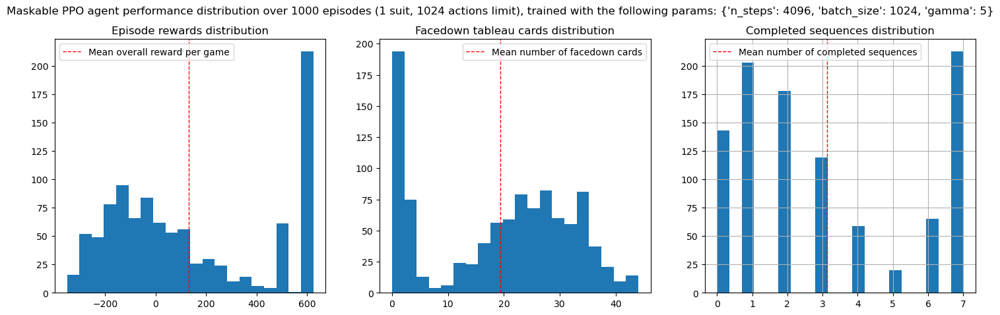

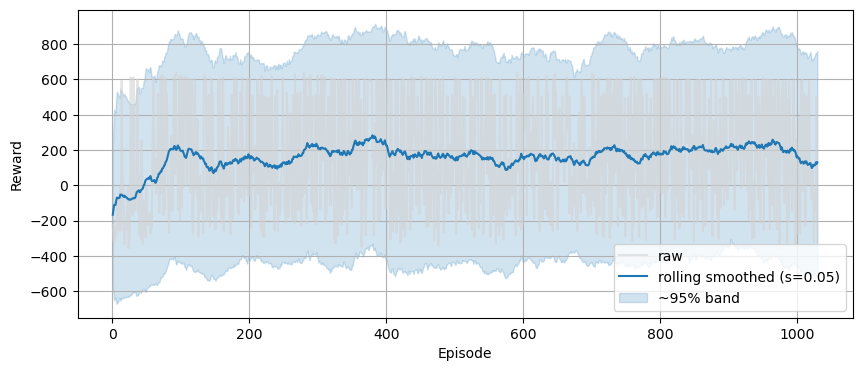

The env has the following rewards: {'complete sequence': 100.0, 'victory': 1000.0, 'step': -0.4, 'NOOP': -0.4, 'discover card': 8.0, 'extend sequence': 0.2, 'deal cards': -0.2, 'free pile': 1.0, 'no available actions': -100, 'reward limit': 200, 'discover_card': 2.0}


In [ ]:
best4 = ["MaskablePPO_1suits_1024_4096_1024__dd2_fp1_es0.2_dc-0.2_ss-0.2",
        "MaskablePPO_1suits_1024_4096_1024__dd2_fp1_es0.2_dc-0.2_ss-0.4",
        "MaskablePPO_1suits_1024_4096_1024__dd5_fp1_es0.2_dc-0.2_ss-0.4",
        "MaskablePPO_1suits_1024_4096_2048__dd2_fp1_es0.2_dc-0.2_ss-0.4",
        ]
for s_model in best4:
    load_and_evaluate_model(s_model, eval_random_walk=False,
                            path =  SAVE_MODELS_DIR + 'MaskablePPO_multiple_configs_parallel\\',
                             n_eval_episodes=1000)

###### models trained with 24 configs: n_steps==4096, batch_size in {1024, 2048}, gamma =0.999 or 0.995, rewards: discover_card in {2,5}, step in {-0.2, -0.4}, deal_cards==-extend sequence==-0.2 or extend seq = 0.1
![Screenshot 2025-12-15 221710.png](<attachment:Screenshot 2025-12-15 221710.png>)
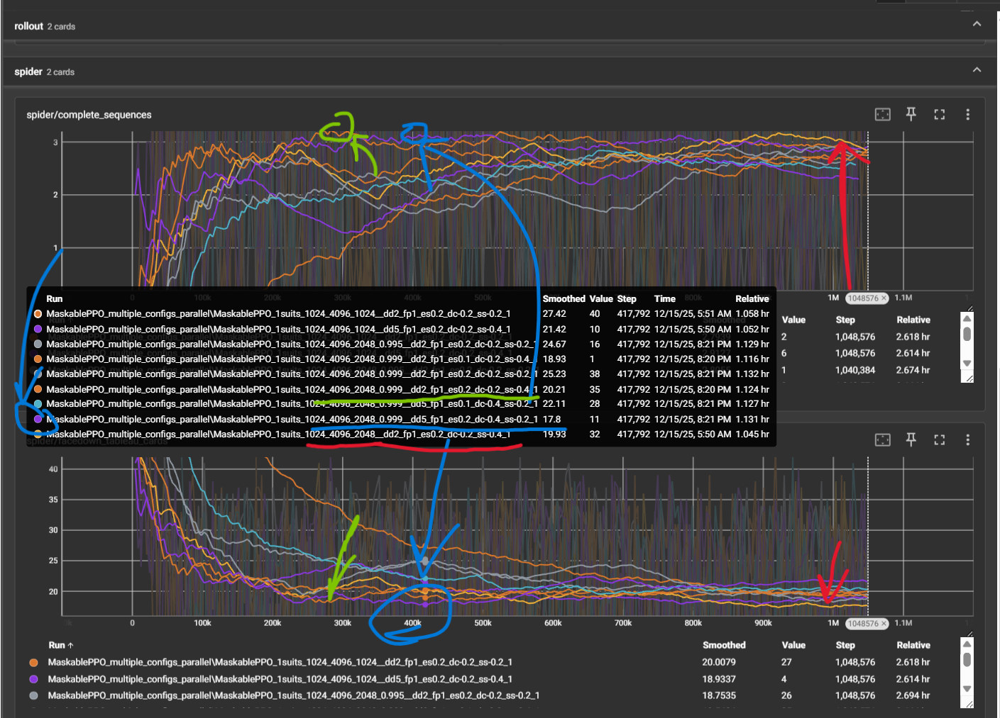

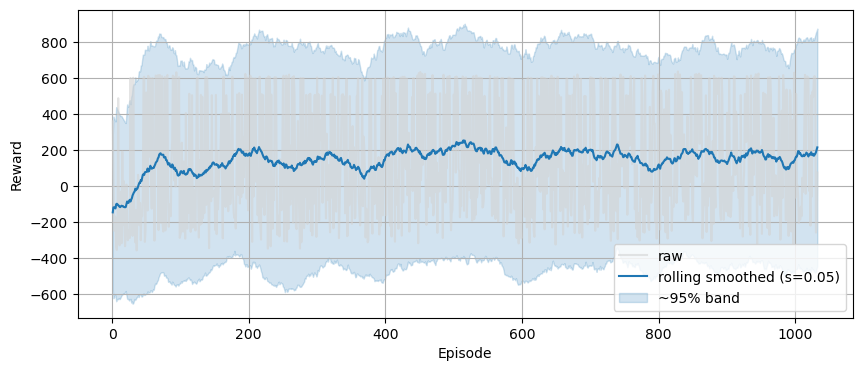

The env has the following rewards: {'complete sequence': 100.0, 'victory': 1000.0, 'step': -0.4, 'NOOP': -0.4, 'discover card': 8.0, 'extend sequence': 0.2, 'deal cards': -0.2, 'free pile': 1.0, 'no available actions': -100, 'reward limit': 200, 'discover_card': 2.0}


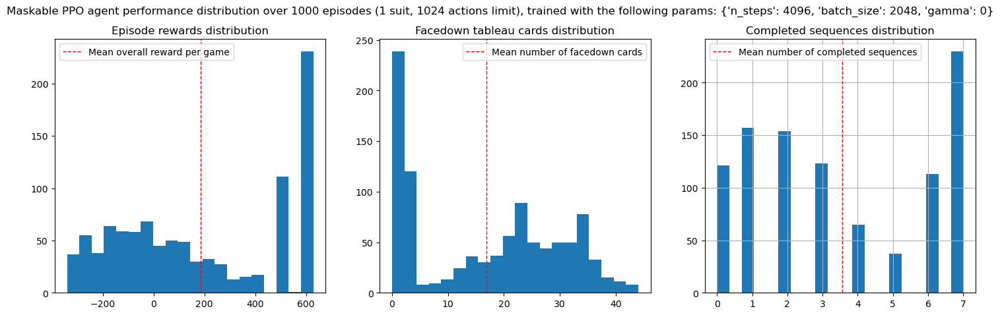

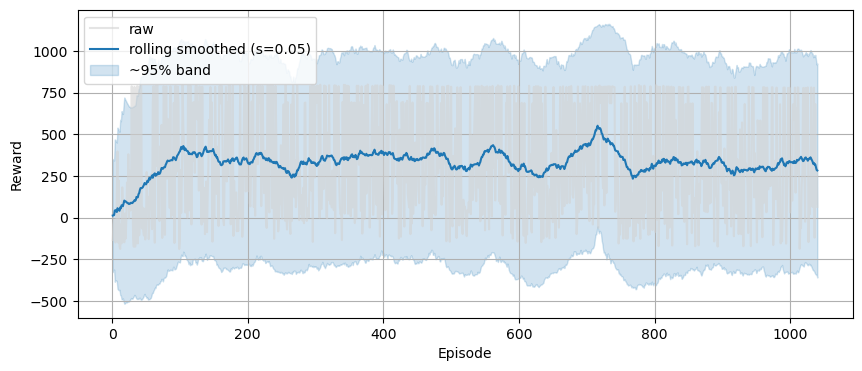

The env has the following rewards: {'complete sequence': 100.0, 'victory': 1000.0, 'step': -0.2, 'NOOP': -0.4, 'discover card': 8.0, 'extend sequence': 0.2, 'deal cards': -0.4, 'free pile': 1.0, 'no available actions': -100, 'reward limit': 200, 'discover_card': 5.0}


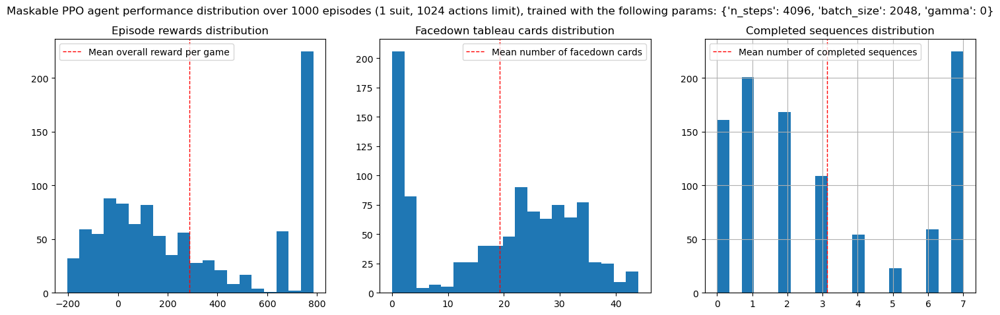

In [26]:
best3 = ["MaskablePPO_1suits_1024_4096_2048_0.999__dd2_fp1_es0.2_dc-0.2_ss-0.4",
        "MaskablePPO_1suits_1024_4096_2048_0.999__dd5_fp1_es0.2_dc-0.4_ss-0.2"
        #,"MaskablePPO_1suits_1024_4096_2048__dd2_fp1_es0.2_dc-0.2_ss-0.4"# the last one in the prev `best4``
        ]

for s_model in best3:
    load_and_evaluate_model(s_model, eval_random_walk=False,
                            path =  SAVE_MODELS_DIR + 'MaskablePPO_multiple_configs_parallel\\',
                             n_eval_episodes=1000)

### 4 suits

In [ ]:

log_dir = LOG_DIR+'MaskablePPO/'

# Define the masking function
def mask_fn(env):
    return env.get_action_mask()  # must return np.ndarray


env = SpiderEnv(n_actions_limit=1_000, _dtype=np.float32, _render_state_timeout=1_000, 
                    _diagnostics_mode=1, vectorize_obs=True, mask_legal_actions=True,
                #rewards_limit=True,
                rewards_policy ={"discover_card": 4,
                                 "free pile": 16,
                                 "extend sequence": 1,
                                 "deal cards": -0.5}
                   )  # must return action_mask in info
env = Monitor(env, log_dir)
env = ActionMasker(env, mask_fn)

model = MaskablePPO(
    "MlpPolicy",
    env,
    verbose=1,
    n_steps=2048,
    batch_size=256,
    learning_rate=3e-4,
    gamma=0.995,
    device="auto",
    tensorboard_log=log_dir
)


model.learn(total_timesteps=1_000_000,callback=SpiderCallback())